# Figures summarizing characterization of each csaQTL

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import cna, pickle, pp, os
import matplotlib.pyplot as plt
import statsmodels.api as sm
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
from sklearn.linear_model import LinearRegression
res_folder = "/data/srlab/lrumker/MCSC_Project/cna-qtl/results/"
fig_dir = "/data/srlab/lrumker/MCSC_Project/cna-qtl/figs/"
title_size=8
label_size=6

In [2]:
# From Okabe & Ito, "colorblind-friendly" palette 
from matplotlib.colors import LinearSegmentedColormap
color_dict = {'orange': '#E69F00', 'skyblue': '#56B4E9', 'green': '#009E73', 
              'yellow': '#F0E442', 'purple': '#CC79A7', 'oceanblue': '#0072B2', 
              'vermillion': '#E63d00'} # O&I use '#D55E00'

## Load table of csaQTLs

In [3]:
loci = pd.read_csv(res_folder+"loci_table.tsv", sep = "\t")
loci['SNP']=[str(loci.CHR.values[i])+":"+str(loci.POS.values[i])+":"+loci['Other Allele'].values[i]+\
             ":"+loci['Effect Allele'].values[i] for i in np.arange(loci.shape[0])]
loci['celltype']=loci['Cell Type'].values
loci

,celltype,#CHROM,POS,ID,REF,ALT,A1,TEST,OBS_CT,P,...,CHR,MAF,Cell Type,SNP,Effect Allele,Other Allele,rsID,Cyto. Band,Phenotype Annotation,Novel
0,Myeloid,15,80263217,15:80263217:C:T,C,T,T,ADD,523,2.607715e-08,...,15,0.27212,Myeloid,15:80263217:C:T,T,C,rs3826007,15q25.1,Decrease in CD16+ monocytes \% myeloid cells,No
1,NK,2,111851212,2:111851212:C:T,C,T,T,ADD,935,1.764828e-09,...,2,0.21504,NK,2:111851212:C:T,T,C,rs13025330,2q13,Decrease in CD56bright \% NK cells,No
2,NK,11,128070535,11:128070535:A:G,A,G,G,ADD,935,2.480238e-13,...,11,0.27872,NK,11:128070535:A:G,G,A,rs519062,11q24.3,Increase in NK cells activated by TNF-$\alpha$...,Yes
3,NK,12,10583611,12:10583611:C:T,C,T,C,ADD,935,1.956080e-11,...,12,0.17811,NK,12:10583611:C:T,T,C,rs3003,12p13.2,Increase in NK cells activated by TNF-$\alpha$...,Yes
4,NK,19,16441973,19:16441973:G:A,G,A,A,ADD,935,1.958433e-13,...,19,0.32867,NK,19:16441973:G:A,A,G,rs56133626,19p13.11,Increase in NK cells activated by TNF-$\alpha$...,Yes


## Export variable gene correlations to phenotypes for gene set enrichment analyses

In [4]:
d = cna.read("/data/srlab/lrumker/datasets/onek1k/pheno/NK.h5ad")
for i_locus in np.arange(1,loci.shape[0]):
    lead_snp = loci.SNP.values[i_locus]
    celltype = loci.celltype.values[i_locus]
    res = pickle.load(open('/data/srlab/lrumker/MCSC_Project/cna-qtl/results/gwas_'+celltype+"/cna_res_"+lead_snp+'.p','rb'))
    res.vargene_cors.to_csv('/data/srlab/lrumker/MCSC_Project/cna-qtl/results/gwas_'+celltype+"/cna_res_"\
                        +lead_snp+'_vargene_cors.csv')

## Helper functions for shared plot elements across csaQTLs

In [5]:
# creates a boxplot of sample-level phenotype values for individuals with each genotype
def geno_cnTrait(d, allele, other_allele, effect_allele, pvalue, rsID, celltype, sel_chr, ax):
    res = pickle.load(open("/data/srlab/lrumker/MCSC_Project/cna-qtl/results/gwas_"+celltype+\
                       "/cna_res_"+allele+".p",'rb'))
    d.samplem[allele+"_binned"]=np.rint(d.samplem[allele]).values
    d.samplem['pheno'] = np.dot(d.uns['NAM_sampleXpc'].iloc[:,:res.k], res.beta)
    geno_jitter = d.samplem[allele+'_binned']+np.random.normal(0, 0.04, d.samplem.shape[0])
    geno_labels = [other_allele+"/"+other_allele, other_allele+"/"+effect_allele, effect_allele+"/"+effect_allele]
    pheno_grouped = [d.samplem.pheno[d.samplem[allele+'_binned']==0], d.samplem.pheno[d.samplem[allele+'_binned']==1],
                       d.samplem.pheno[d.samplem[allele+'_binned']==2],]
    ax.scatter(geno_jitter, d.samplem.pheno, color = "dimgrey", s = 0.2)
    ax.boxplot(pheno_grouped, positions=[0,1,2], showfliers=False, boxprops= dict(linewidth=0.5, color='black'),
                            whiskerprops=dict(linewidth=0.5, color='black'), showcaps = False,
                            medianprops=dict(linewidth=1.25, color='black'))
    ax.text(-0.4, np.max(d.samplem.pheno)+0.15*np.max(d.samplem.pheno), 
            'p='+'{:.0e}'.format(pvalue), fontsize = label_size)
    ax.spines[['right', 'top']].set_visible(False)
    ax.set_xlabel(rsID, fontsize=label_size)
    ax.set_ylabel("Sample-Level\nPhenotype", fontsize=label_size)
    ax.set_xticks([0,1,2])
    ax.set_xticklabels(geno_labels)
    ax.tick_params(axis='both', which='minor', labelsize=label_size)
    ax.tick_params(axis='both', which='major', labelsize=label_size)

In [6]:
# functions for plotting heatmap of gene expression correlations to neighborhood-level phenotype
def get_binned_expr(d, celltype, allele, gene_count=4, nbins = 1000, 
                    sel_genes=None, verbose = False):
    res = pickle.load(open("/data/srlab/lrumker/MCSC_Project/cna-qtl/results/gwas_"+celltype+\
                       "/cna_res_"+allele+".p",'rb'))
    vargene_cors = res.vargene_cors
    vargene_cors = vargene_cors.iloc[np.argsort(vargene_cors.cor),:]
    if sel_genes is None:
        vargene_cors = pd.concat([vargene_cors.head(gene_count), vargene_cors.tail(gene_count)])
        vargene_cors.reset_index(inplace = True)
    else:
        vargene_cors = vargene_cors.set_index("gene").loc[sel_genes].reset_index()
        if verbose:
            print(vargene_cors)
    i_genes = [np.where(d.var.index==vargene_cors.gene.values[i])[0][0] for i in vargene_cors.index]
    expr_mat = pd.DataFrame(d.X[res.kept,:][:,i_genes])
    expr_mat.columns = vargene_cors.gene.values
    expr_mat["Buffer"] = res.ncorrs/np.std(res.ncorrs)
    expr_mat['Phenotype'] = res.ncorrs/np.std(res.ncorrs)
    expr_mat = expr_mat.iloc[np.argsort(expr_mat.Phenotype),:].reset_index(drop = True)
    expr_mat = expr_mat.T
    expr_mat = expr_mat.iloc[np.arange(expr_mat.shape[0])[::-1],:]

    # Bins of neighborhoods based on phenotype
    def bin_vals(expr_mat, i_row, bins):
        return pd.DataFrame({"bin": bins, 'val': expr_mat.iloc[i_row,:]}).groupby('bin').mean().val.values.reshape(1,-1)
    bins = np.digitize(expr_mat.iloc[0,:], bins = np.quantile(expr_mat.iloc[0,:], np.arange(0,1, 1/nbins)))
    binned_mat = pd.DataFrame(np.concatenate([bin_vals(expr_mat, i_row, bins) for i_row in np.arange(expr_mat.shape[0])]))
    binned_mat.index = expr_mat.index
    return(binned_mat)

def plot_gene_heatmap(binned_mat, ax, padding = 0.15):
    im = ax.imshow(binned_mat, cmap="seismic", interpolation='none',
               vmin = np.quantile(binned_mat,0.05), vmax=np.quantile(binned_mat,0.95))

    # set xlabels
    ax.set_xlabel("Neighborhoods", fontsize = title_size)
    ax.set_xticks([])
    ax.set_xticklabels([])

    # set ylabels
    yticks = np.arange(binned_mat.shape[0]) # remove buffer row
    yticks = [yticks[i] for i in np.arange(len(yticks)) if i!=1]
    ax.set_yticks(yticks)
    ylabels = binned_mat.index[yticks] # italicize gene names
    ylabels = ['$'+ylabels[i]+'$' if i>0 else ylabels[i] for i in np.arange(len(ylabels)) ]
    ax.set_yticklabels(ylabels, fontsize=label_size)
    ax.set_ylabel("Genes         ", fontsize = title_size)

    # white grid
    ax.set_yticks(np.arange(-0.5, binned_mat.shape[0], 1), minor=True)
    ax.grid(which='minor', axis='y', linestyle='-', color='white', linewidth=2)
    
    ax.add_patch(
         patches.Rectangle(
             (-1, # start along x axis
              0.5), # start along y axis
             binned_mat.shape[1]+1,
             1, #height in rows
             color="white",
             fill=True, lw=0
         ) )

    ax.set_aspect('auto')

    cbar = plt.colorbar(im, ticks = [], shrink=0.3, location='top', ax = ax)
    cbar.set_ticklabels([])
    ax.text(300,-0.20*binned_mat.shape[0],'Abundance correlation', fontsize=label_size)
    ax.text(270,-0.12*binned_mat.shape[0],'Neg', fontsize=label_size)
    ax.text(655,-0.12*binned_mat.shape[0],'Pos', fontsize=label_size)
    cbar.outline.set_visible(False)
    cbar.ax.set_zorder(ax.get_zorder()+1)

    cbar = plt.colorbar(im, ticks = [], shrink=0.3, location = 'bottom', pad=padding, ax = ax)
    ax.text(400,binned_mat.shape[0]+0.15*binned_mat.shape[0],'Expression', fontsize=label_size)
    ax.text(270,binned_mat.shape[0]+0.21*binned_mat.shape[0],'Low', fontsize=label_size)
    ax.text(655,binned_mat.shape[0]+0.21*binned_mat.shape[0],'High', fontsize=label_size)
    cbar.set_ticklabels([]) 
    cbar.outline.set_visible(False)
    cbar.ax.set_zorder(ax.get_zorder()+1)

    ax.spines[['top', 'bottom']].set_visible(False)

## Direct associations to cytokine response

In [7]:
# load NK object
d = cna.read("/data/srlab/lrumker/datasets/onek1k/pheno/NK.h5ad")
kept_cells = d.uns['keptcells']
UMAP1 = d.obsm['X_umap'][kept_cells,0]
UMAP2 = d.obsm['X_umap'][kept_cells,1]

alleles = ['11:128070535:A:G', '12:10583611:C:T', '19:16441973:G:A']

# Add genotype information for lead SNPs
for allele in loci.SNP.values[1:]:
    sel_chr = allele.split(":")[0]
    G = pd.read_csv("/data/srlab/lrumker/MCSC_Project/cna-qtl/results/geno_munge/sig_snps/NK"+\
                    "_sigsnps.DS.vcf.gz", header = None, sep = "\t", index_col=0)
    G_iids = pd.read_csv("/data/srlab/lrumker/datasets/onek1k/geno/"+\
                     "sample_labels/sample_list_rowsep.txt", header = None).iloc[:,0].values
    G.columns = G_iids
    G.index = [G.index[i].strip() for i in np.arange(G.shape[0])]
    d.samplem = d.samplem.join(G.T[allele])

In [8]:
# Load enriched gene sets from MGSigDB
# Note: these files and results are generated by the Gene_Set_Enrichment notebook
stimuli = {'11:128070535:A:G': ['tnfa', 'ifng'],
           '12:10583611:C:T': ['tnfa', 'ifng', 'il2', 'il6'],
           '19:16441973:G:A': ['tnfa']}
# Value per cell is sum of normalized expression values across vargenes in set

tnfa = pd.read_csv("/data/srlab/lrumker/MCSC_Project/cna-qtl/results/annotation/TNFA_geneset.csv").x.values
found = [tnfa[i] in d.var.index.values for i in np.arange(len(tnfa))]
tnfa = tnfa[found]
ix_tnfa = [np.where(d.var.index==tnfa[i])[0][0] for i in np.arange(len(tnfa))]
d.obs['tnfa'] = np.array(d.X[:,ix_tnfa].sum(axis=1)).reshape(-1,)

ifng = pd.read_csv("/data/srlab/lrumker/MCSC_Project/cna-qtl/results/annotation/IFNG_geneset.csv").x.values
found = [ifng[i] in d.var.index.values for i in np.arange(len(ifng))]
ifng = ifng[found]
ix_ifng = [np.where(d.var.index==ifng[i])[0][0] for i in np.arange(len(ifng))]
d.obs['ifng'] = np.array(d.X[:,ix_ifng].sum(axis=1)).reshape(-1,)

il2 = pd.read_csv("/data/srlab/lrumker/MCSC_Project/cna-qtl/results/annotation/IL2_geneset.csv").x.values
found = [il2[i] in d.var.index.values for i in np.arange(len(il2))]
il2 = il2[found]
ix_il2 = [np.where(d.var.index==il2[i])[0][0] for i in np.arange(len(il2))]
d.obs['il2'] = np.array(d.X[:,ix_il2].sum(axis=1)).reshape(-1,)

il6 = pd.read_csv("/data/srlab/lrumker/MCSC_Project/cna-qtl/results/annotation/IL6_geneset.csv").x.values
found = [il6[i] in d.var.index.values for i in np.arange(len(il6))]
il6 = il6[found]
ix_il6 = [np.where(d.var.index==il6[i])[0][0] for i in np.arange(len(il6))]
d.obs['il6'] = np.array(d.X[:,ix_il6].sum(axis=1)).reshape(-1,)

# Ignore batchy regions
d.obs.loc[~kept_cells, 'tnfa'] = np.nan
d.obs.loc[~kept_cells, 'ifng'] = np.nan
d.obs.loc[~kept_cells, 'il2'] = np.nan
d.obs.loc[~kept_cells, 'il6'] = np.nan

d.obs_to_sample(['tnfa', 'ifng', 'il2', 'il6'], aggregate = np.mean)

In [9]:
# Test genotype associations to mean expression of cytokine response per individual
stimulus_print = {'tnfa': r'TNF-$\alpha$', 'ifng': r'IFN-$\gamma$', 'il2': 'IL-2', 'il6': 'IL-6'}
covs = ['age', 'sex_M', 'gPC1', 'gPC2', 'gPC3', 'gPC4', 'gPC5', 'gPC6']
all_res = pd.DataFrame({})
for allele in ['12:10583611:C:T', '19:16441973:G:A', '11:128070535:A:G']:
    for stimulus in stimuli[allele]:
        key = allele.split(":")[0]
        geno = sm.add_constant(d.samplem[allele])
        linmod = sm.OLS(d.samplem[stimulus].values.astype(float), geno).fit()
        rsq = linmod.rsquared # explained by genotype alone
        geno = sm.add_constant(d.samplem[np.concatenate([[allele],covs])]) # accounting for covariates
        linmod = sm.OLS(d.samplem[stimulus].values.astype(float), geno).fit()
        p_val = linmod.pvalues[allele]/2 # one-sided test for increase
    
        all_res = pd.concat([all_res, pd.DataFrame({"csaQTL": [allele], "Stimulus": [stimulus_print[stimulus]], 
                                                    "r-squared": [rsq], "P": [p_val]})])

/PHShome/lar24/anaconda3/envs/py3_clone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)
/PHShome/lar24/anaconda3/envs/py3_clone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)
/PHShome/lar24/anaconda3/envs/py3_clone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)
/PHShome/lar24/anaconda3/envs/py3_clone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[:

In [10]:
with open('/data/srlab/lrumker/MCSC_Project/cna-qtl/tables/supptable.cytokine_response.tex','w') as tf:
    tf.write(all_res.to_latex(index = False, escape=False))
all_res

,csaQTL,Stimulus,r-squared,P
0,12:10583611:C:T,TNF-$\alpha$,0.008370,0.006119
0,12:10583611:C:T,IFN-$\gamma$,0.004367,0.033220
0,12:10583611:C:T,IL-2,0.007334,0.009544
0,12:10583611:C:T,IL-6,0.009894,0.003338
0,19:16441973:G:A,TNF-$\alpha$,0.005125,0.019800
0,11:128070535:A:G,TNF-$\alpha$,0.000439,0.199147
0,11:128070535:A:G,IFN-$\gamma$,0.002636,0.026951


## csaQTL at 12p13.2 Figure

In [11]:
# Applies to all the figures
outer_titles = ['GeNA Output', 'Phenotype Annotation', 
                'Colocalization of molecular, tissue and organism-level traits']

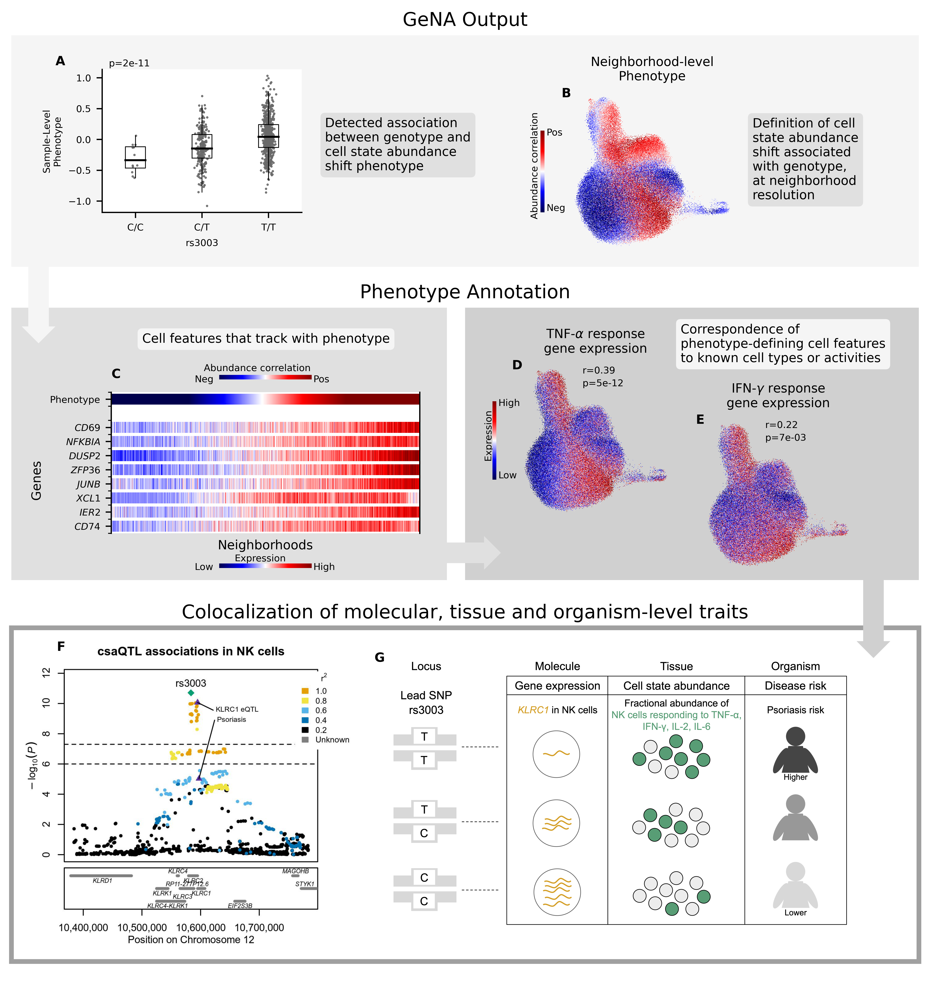

In [12]:
i_locus=3
fig = plt.figure(figsize=(8,6), dpi=650, facecolor="white")
vertical_buffer=0.04
other_allele = loci.SNP.values[i_locus].split(":")[2]
effect_allele = loci.SNP.values[i_locus].split(":")[3]
rsID = loci.rsID.values[i_locus]

outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=0.04,left=0, top=0.53,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.set_title(outer_titles[2])
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor("None")
outerax.spines[['top', 'right', 'bottom', 'left']].set_color("#A0A0A0")
outerax.spines[['top', 'right', 'bottom', 'left']].set_linewidth(3)

base = 0.6
outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0, top=1,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.set_title(outer_titles[1])
outerax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor('None')

outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0, top=1,  right=0.48)
outerax1 = fig.add_subplot(outergs[0])
outerax1.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax1.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax1.set_facecolor("#E0E0E0")
t = outerax1.text(1.02, 0.1, "                   ", ha="center", va="center", rotation=0, size=7,
            bbox=dict(boxstyle="rarrow,pad=0.3", fc="#E0E0E0", ec="#E0E0E0", lw=2))

outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0.5, top=1,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor("#D0D0D0")
t = outerax.text(0.9, -0.12, "                   ", ha="center", va="center", rotation=-90, size=7,
            bbox=dict(boxstyle="rarrow,pad=0.3", fc="#D0D0D0", ec="#D0D0D0", lw=2))
outerax1.set_zorder(outerax.get_zorder()+1)
t="Correspondence of\nphenotype-defining cell features\nto known cell types or activities"
outerax.text(0.475, 0.8, t, ha='left', fontsize = title_size, bbox=dict(boxstyle="round", 
                                                                       ec="#F5F5F5", fc="#F5F5F5"))

### TNFa UMAP
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.09, left=0.5, top=0.92,  right=0.73)
ax = fig.add_subplot(gs[0])
res = pickle.load(open('/data/srlab/lrumker/MCSC_Project/cna-qtl/results/gwas_NK/cna_res_'+loci.SNP[i_locus]+'.p','rb'))
cbar_plot = plt.scatter(UMAP1, UMAP2, c = d.obs.tnfa[kept_cells], s=0.1, cmap="seismic")
cover_plot = plt.scatter(UMAP1, UMAP2, c = "#D0D0D0", s=1)
pp.scatter_random(UMAP1, UMAP2, c = d.obs.tnfa[kept_cells], cmap = "seismic", ax = ax,
                 vmin=np.quantile(d.obs.tnfa[kept_cells],0.05), vmax=np.quantile(d.obs.tnfa[kept_cells],0.95), 
                  symmetrize = False)
ax.set_title(r"TNF-$\alpha$ response"+"\ngene expression", fontsize = title_size)
r_val = np.around(np.corrcoef(res.ncorrs, d.obs['tnfa'][kept_cells])[0,1],2)
ax.text(-0.6, np.max(UMAP2)-0.05*np.max(UMAP2), 'r='+str(r_val), fontsize = label_size)
ax.text(-0.6, np.max(UMAP2)-0.2*np.max(UMAP2), 'p='+'{:.0e}'.format(5.2e-12), fontsize = label_size)
ax.axis("off")
cbar = plt.colorbar(cbar_plot, ticks = [], shrink=0.5, location='left', ax = ax)
cbar.set_ticklabels([])
ax.text(-9.6,-0.05*np.max(UMAP2),'Expression', fontsize=label_size, rotation = 90)
ax.text(-8.25,-0.28*np.max(UMAP2),'Low', fontsize=label_size)
ax.text(-8.25,0.57*np.max(UMAP2),'High', fontsize=label_size)
ax.text(-7, np.max(UMAP2),'D',fontsize=title_size, fontweight="bold")
cbar.outline.set_visible(False)

### IFNg UMAP
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.01, left=0.76, top=0.84,  right=0.93)
ax = fig.add_subplot(gs[0])
pp.scatter_random(UMAP1, UMAP2, c = d.obs.ifng[kept_cells], cmap = "seismic", ax = ax,
                 vmin=np.quantile(d.obs.ifng[kept_cells],0.05), vmax=np.quantile(d.obs.ifng[kept_cells],0.95), 
                  symmetrize = False)
ax.set_title(r"IFN-$\gamma$ response"+"\ngene expression", fontsize = title_size)
r_val = np.around(np.corrcoef(res.ncorrs, d.obs['ifng'][kept_cells])[0,1],2)
ax.text(-0.6, np.max(UMAP2)-0.05*np.max(UMAP2), 'r='+str(r_val), fontsize = label_size)
ax.text(-0.6, np.max(UMAP2)-0.2*np.max(UMAP2), 'p='+'{:.0e}'.format(6.7e-03), fontsize = label_size)
ax.axis("off")
ax.text(-7, np.max(UMAP2),'E',fontsize=title_size, fontweight="bold")

### Expression heatmap
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base-0.02, left=0.11, top=0.95,  right=0.45)
ax = fig.add_subplot(gs[0])
plot_gene_heatmap(get_binned_expr(d, celltype="NK", allele = '12:10583611:C:T', 
                                  sel_genes = ['CD69', 'NFKBIA', 'DUSP2', 
                                              'ZFP36', 'JUNB', 'XCL1', 'IER2', 'CD74'][::-1]), ax)
ax.set_zorder(outerax1.get_zorder()+1)
ax.text(100, -4, "Cell features that track with phenotype", ha='left', fontsize = title_size, 
        bbox=dict(boxstyle="round", ec="#F5F5F5", fc="#F5F5F5"))
ax.text(0,-1.5,'C',fontsize=title_size, fontweight="bold")

base = 1.06
outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0, top=1.4,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.set_title(outer_titles[0])
outerax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor("#F5F5F5")
t = outerax.text(0.03, -0.15, "                 ", ha="center", va="center", rotation=-90, size=7,
            bbox=dict(boxstyle="rarrow,pad=0.3", fc="#F5F5F5", ec="#F5F5F5", lw=2))
outerax.set_zorder(outerax1.get_zorder()+1)

### Boxplot
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.08, left=0.1, top=1.35,  right=0.32)
ax = fig.add_subplot(gs[0])
geno_cnTrait(d, allele = loci.SNP[i_locus], other_allele = loci["Other Allele"][i_locus], 
             effect_allele = loci['Effect Allele'][i_locus], pvalue = loci.P[i_locus], 
             rsID = loci.rsID[i_locus], celltype = loci.celltype[i_locus], 
             sel_chr= loci.CHR[i_locus], ax=ax)
ax.set_zorder(outerax.get_zorder()+1)
ax.text(2.85, -0.5, "Detected association\nbetween genotype and\ncell state abundance\nshift phenotype", 
        ha='left', fontsize = title_size, bbox=dict(boxstyle="round", ec="#E0E0E0", fc="#E0E0E0"))
ax.text(-1.2,1.2,'A',fontsize=title_size, fontweight="bold")

### ncorrs UMAP
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.02, left=0.55, top=1.32, right=0.8)
ax = fig.add_subplot(gs[0])
cbar_plot = plt.scatter(UMAP1, UMAP2, c = res.ncorrs, s=0.1, cmap="seismic")
cover_plot = plt.scatter(UMAP1, UMAP2, c = "#F5F5F5", s=1)
pp.scatter_random(UMAP1, UMAP2, c = res.ncorrs, ax = ax, cmap="seismic")
ax.set_title("Neighborhood-level\nPhenotype", fontsize = title_size)
cbar = plt.colorbar(cbar_plot, ticks = [], shrink=0.5, location='left', ax = ax)
cbar.set_ticklabels([])
ax.text(-9.6,-0.35*np.max(UMAP2),'Abundance correlation', fontsize=label_size, rotation = 90)
ax.text(-8.25,-0.28*np.max(UMAP2),'Neg', fontsize=label_size)
ax.text(-8.25,0.57*np.max(UMAP2),'Pos', fontsize=label_size)
cbar.outline.set_visible(False)
ax.axis("off")
ax.set_zorder(outerax.get_zorder()+1)
cbar.ax.set_zorder(outerax.get_zorder()+1)
ax.text(-7,np.max(UMAP2),'B',fontsize=title_size, fontweight="bold")
ax.text(9, -1.3, "Definition of cell\nstate abundance\nshift associated\nwith genotype,\n"+\
        "at neighborhood\nresolution", ha='left', fontsize = title_size, 
        bbox=dict(boxstyle="round", ec="#E0E0E0", fc="#E0E0E0"))

### Locus zoom 
locus_zoom_12 = plt.imread(fig_dir+'NK_chr12_regional.jpg')
zoomax = fig.add_axes([-0.035,0.045,0.48,0.48], anchor='NE')
zoomax.imshow(locus_zoom_12)
zoomax.axis('off')
zoomax.set_in_layout(False)

### KLRC1 diagram
KLRC1_diagram = plt.imread(fig_dir+'KLRC1_diagram.png')
newax = fig.add_axes([0.4,-0.075,0.56,0.56], anchor='NE')
newax.imshow(KLRC1_diagram)
newax.axis('off')
newax.set_in_layout(False)
newax.set_zorder(zoomax.get_zorder()+1)

gs = gridspec.GridSpec(1,1)
gs.update(bottom=0,left=0, top=0.4,  right=1)
ax = fig.add_subplot(gs[0])
ax.text(0.05,1.24,'F',fontsize=title_size, fontweight="bold")
ax.text(0.4,1.2,'G',fontsize=title_size, fontweight="bold")
ax.axis("off")
ax.set_zorder(newax.get_zorder()+1)

plt.savefig(fig_dir+"mainfig.csaQTL_chr12.png", bbox_inches='tight')
plt.show()

## csaQTL at 11q24.3

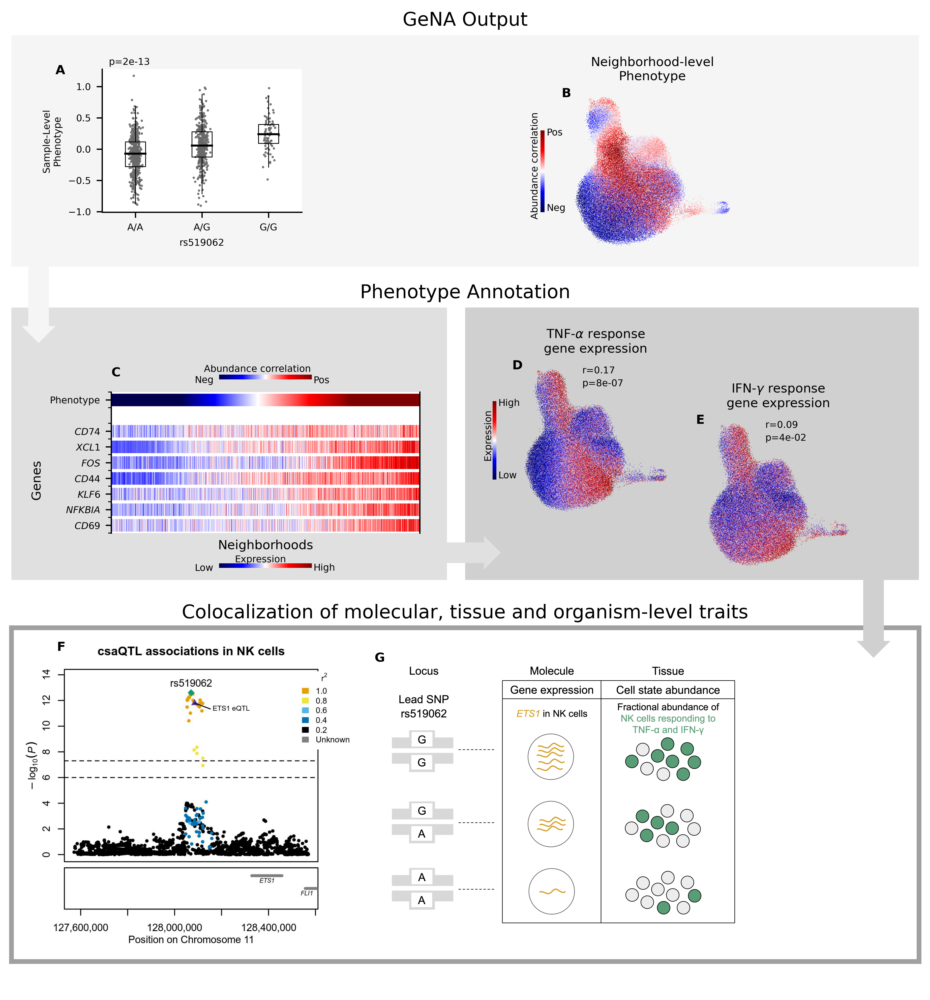

In [13]:
fig = plt.figure(figsize=(8,6), dpi=450, facecolor="white")
i_locus = 2
other_allele = loci.SNP.values[i_locus].split(":")[2]
effect_allele = loci.SNP.values[i_locus].split(":")[3]
rsID = loci.rsID.values[i_locus]
vertical_buffer=0.04

outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=0.04,left=0, top=0.53,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.set_title(outer_titles[2])
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor("None")
outerax.spines[['top', 'right', 'bottom', 'left']].set_color("#A0A0A0")
outerax.spines[['top', 'right', 'bottom', 'left']].set_linewidth(3)

base = 0.6
outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0, top=1,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.set_title(outer_titles[1])
outerax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor('None')

outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0, top=1,  right=0.48)
outerax1 = fig.add_subplot(outergs[0])
outerax1.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax1.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax1.set_facecolor("#E0E0E0")
t = outerax1.text(1.02, 0.1, "                   ", ha="center", va="center", rotation=0, size=7,
            bbox=dict(boxstyle="rarrow,pad=0.3", fc="#E0E0E0", ec="#E0E0E0", lw=2))

outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0.5, top=1,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor("#D0D0D0")
t = outerax.text(0.9, -0.12, "                   ", ha="center", va="center", rotation=-90, size=7,
            bbox=dict(boxstyle="rarrow,pad=0.3", fc="#D0D0D0", ec="#D0D0D0", lw=2))
outerax1.set_zorder(outerax.get_zorder()+1)

### TNFa UMAP
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.09, left=0.5, top=0.92,  right=0.73)
ax = fig.add_subplot(gs[0])
res = pickle.load(open('/data/srlab/lrumker/MCSC_Project/cna-qtl/results/gwas_NK/cna_res_'+loci.SNP[i_locus]+'.p','rb'))
cbar_plot = plt.scatter(UMAP1, UMAP2, c = d.obs.tnfa[kept_cells], s=0.1, cmap="seismic")
cover_plot = plt.scatter(UMAP1, UMAP2, c = "#D0D0D0", s=1)
pp.scatter_random(UMAP1, UMAP2, c = d.obs.tnfa[kept_cells], cmap = "seismic", ax = ax,
                 vmin=np.quantile(d.obs.tnfa[kept_cells],0.05), vmax=np.quantile(d.obs.tnfa[kept_cells],0.95), 
                  symmetrize = False)
ax.set_title(r"TNF-$\alpha$ response"+"\ngene expression", fontsize = title_size)
r_val = np.around(np.corrcoef(res.ncorrs, d.obs['tnfa'][kept_cells])[0,1],2)
ax.text(-0.6, np.max(UMAP2)-0.05*np.max(UMAP2), 'r='+str(r_val), fontsize = label_size)
ax.text(-0.6, np.max(UMAP2)-0.2*np.max(UMAP2), 'p='+'{:.0e}'.format(8.4e-07), fontsize = label_size)
ax.axis("off")
cbar = plt.colorbar(cbar_plot, ticks = [], shrink=0.5, location='left', ax = ax)
cbar.set_ticklabels([])
ax.text(-9.6,-0.05*np.max(UMAP2),'Expression', fontsize=label_size, rotation = 90)
ax.text(-8.25,-0.28*np.max(UMAP2),'Low', fontsize=label_size)
ax.text(-8.25,0.57*np.max(UMAP2),'High', fontsize=label_size)
ax.text(-7, np.max(UMAP2),'D',fontsize=title_size, fontweight="bold")
cbar.outline.set_visible(False)

### IFNg UMAP
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.01, left=0.76, top=0.84,  right=0.93)
ax = fig.add_subplot(gs[0])
pp.scatter_random(UMAP1, UMAP2, c = d.obs.ifng[kept_cells], cmap = "seismic", ax = ax,
                 vmin=np.quantile(d.obs.ifng[kept_cells],0.05), vmax=np.quantile(d.obs.ifng[kept_cells],0.95), 
                  symmetrize = False)
ax.set_title(r"IFN-$\gamma$ response"+"\ngene expression", fontsize = title_size)
r_val = np.around(np.corrcoef(res.ncorrs, d.obs['ifng'][kept_cells])[0,1],2)
ax.text(-0.6, np.max(UMAP2)-0.05*np.max(UMAP2), 'r='+str(r_val), fontsize = label_size)
ax.text(-0.6, np.max(UMAP2)-0.2*np.max(UMAP2), 'p='+'{:.0e}'.format(4.0e-02), fontsize = label_size)
ax.axis("off")
ax.text(-7, np.max(UMAP2),'E',fontsize=title_size, fontweight="bold")

### Expression heatmap
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base-0.02, left=0.11, top=0.95,  right=0.45)
ax = fig.add_subplot(gs[0])
plot_gene_heatmap(get_binned_expr(d, celltype="NK", allele = '11:128070535:A:G', 
                                  sel_genes = ['CD69', 'NFKBIA', 
                                               'KLF6', 'CD44', 'FOS', 
                                               'XCL1','CD74'], verbose = False), ax)
ax.set_zorder(outerax1.get_zorder()+1)
ax.text(0,-1.5,'C',fontsize=title_size, fontweight="bold")

base = 1.06
outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0, top=1.4,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.set_title(outer_titles[0])
outerax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor("#F5F5F5")
t = outerax.text(0.03, -0.15, "                 ", ha="center", va="center", rotation=-90, size=7,
            bbox=dict(boxstyle="rarrow,pad=0.3", fc="#F5F5F5", ec="#F5F5F5", lw=2))
outerax.set_zorder(outerax1.get_zorder()+1)

### Boxplot
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.08, left=0.1, top=1.35,  right=0.32)
ax = fig.add_subplot(gs[0])
geno_cnTrait(d, allele = loci.SNP[i_locus], other_allele = loci["Other Allele"][i_locus], 
             effect_allele = loci['Effect Allele'][i_locus], pvalue = loci.P[i_locus], 
             rsID = loci.rsID[i_locus], celltype = loci.celltype[i_locus], 
             sel_chr= loci.CHR[i_locus], ax=ax)
ax.set_zorder(outerax.get_zorder()+1)
ax.text(-1.2,1.2,'A',fontsize=title_size, fontweight="bold")

### ncorrs UMAP
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.02, left=0.55, top=1.32, right=0.8)
ax = fig.add_subplot(gs[0])
cbar_plot = plt.scatter(UMAP1, UMAP2, c = res.ncorrs, s=0.1, cmap="seismic")
cover_plot = plt.scatter(UMAP1, UMAP2, c = "#F5F5F5", s=1)
pp.scatter_random(UMAP1, UMAP2, c = res.ncorrs, ax = ax, cmap="seismic")
ax.set_title("Neighborhood-level\nPhenotype", fontsize = title_size)
cbar = plt.colorbar(cbar_plot, ticks = [], shrink=0.5, location='left', ax = ax)
cbar.set_ticklabels([])
ax.text(-9.6,-0.35*np.max(UMAP2),'Abundance correlation', fontsize=label_size, rotation = 90)
ax.text(-8.25,-0.28*np.max(UMAP2),'Neg', fontsize=label_size)
ax.text(-8.25,0.57*np.max(UMAP2),'Pos', fontsize=label_size)
cbar.outline.set_visible(False)
ax.axis("off")
ax.set_zorder(outerax.get_zorder()+1)
cbar.ax.set_zorder(outerax.get_zorder()+1)
ax.text(-7,np.max(UMAP2),'B',fontsize=title_size, fontweight="bold")

### Locus zoom 
locus_zoom_12 = plt.imread(fig_dir+'NK_chr11_regional.jpg')
zoomax = fig.add_axes([-0.035,0.045,0.48,0.48], anchor='NE')
zoomax.imshow(locus_zoom_12)
zoomax.axis('off')
zoomax.set_in_layout(False)

### diagram
diagram = plt.imread(fig_dir+'ETS1_diagram.png')
newax = fig.add_axes([0.4,-0.08,0.56,0.56], anchor='NE')
newax.imshow(diagram)
newax.axis('off')
newax.set_in_layout(False)
newax.set_zorder(zoomax.get_zorder()+1)

gs = gridspec.GridSpec(1,1)
gs.update(bottom=0,left=0, top=0.4,  right=1)
ax = fig.add_subplot(gs[0])
ax.text(0.05,1.24,'F',fontsize=title_size, fontweight="bold")
ax.text(0.4,1.2,'G',fontsize=title_size, fontweight="bold")
ax.axis("off")
ax.set_zorder(newax.get_zorder()+1)

plt.savefig(fig_dir+"suppfig.csaQTL_chr11.png", bbox_inches='tight')
plt.show()

## csaQTL at 19p13.11

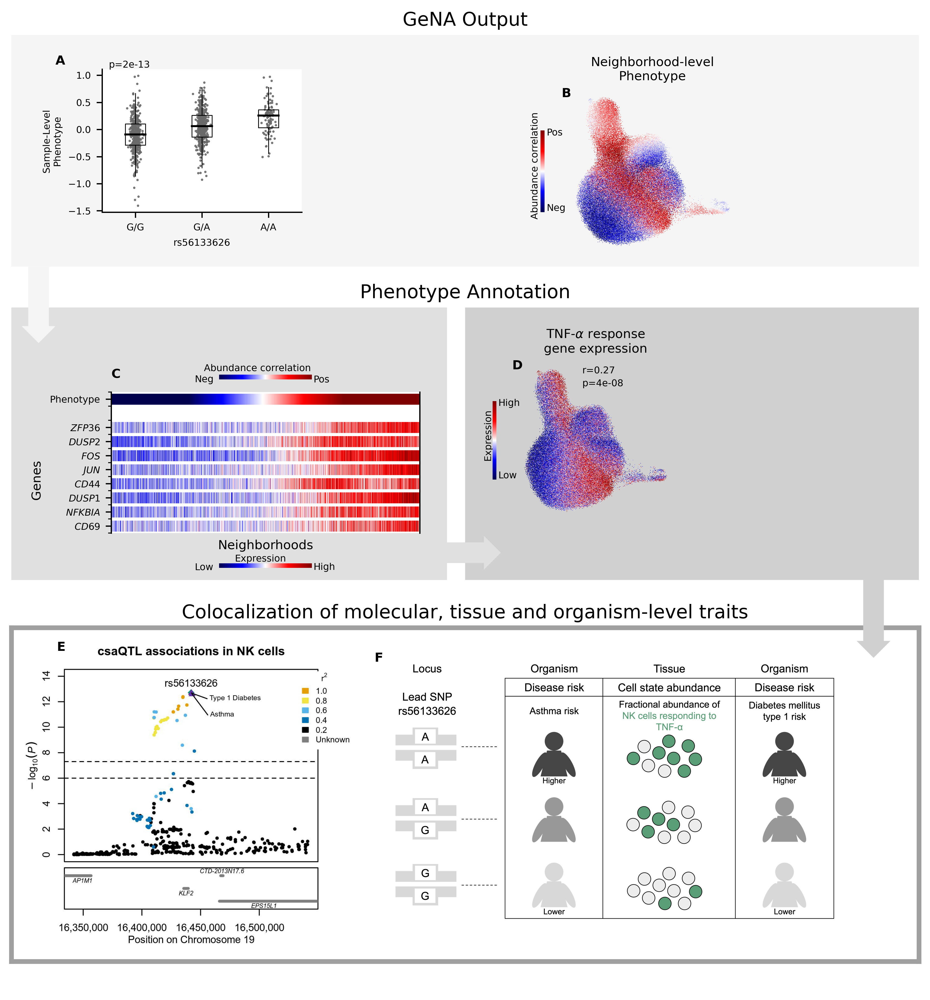

In [14]:
fig = plt.figure(figsize=(8,6), dpi=450, facecolor="white")
i_locus = 4
other_allele = loci.SNP.values[i_locus].split(":")[2]
effect_allele = loci.SNP.values[i_locus].split(":")[3]
rsID = loci.rsID.values[i_locus]
vertical_buffer=0.04

outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=0.04,left=0, top=0.53,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.set_title(outer_titles[2])
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor("None")
outerax.spines[['top', 'right', 'bottom', 'left']].set_color("#A0A0A0")
outerax.spines[['top', 'right', 'bottom', 'left']].set_linewidth(3)

base = 0.6
outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0, top=1,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.set_title(outer_titles[1])
outerax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor('None')

outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0, top=1,  right=0.48)
outerax1 = fig.add_subplot(outergs[0])
outerax1.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax1.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax1.set_facecolor("#E0E0E0")
t = outerax1.text(1.02, 0.1, "                   ", ha="center", va="center", rotation=0, size=7,
            bbox=dict(boxstyle="rarrow,pad=0.3", fc="#E0E0E0", ec="#E0E0E0", lw=2))

outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0.5, top=1,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor("#D0D0D0")
t = outerax.text(0.9, -0.12, "                   ", ha="center", va="center", rotation=-90, size=7,
            bbox=dict(boxstyle="rarrow,pad=0.3", fc="#D0D0D0", ec="#D0D0D0", lw=2))
outerax1.set_zorder(outerax.get_zorder()+1)

### TNFa UMAP
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.09, left=0.5, top=0.92,  right=0.73)
ax = fig.add_subplot(gs[0])
res = pickle.load(open('/data/srlab/lrumker/MCSC_Project/cna-qtl/results/gwas_NK/cna_res_'+\
                       loci.SNP[i_locus]+'.p','rb'))
cbar_plot = plt.scatter(UMAP1, UMAP2, c = d.obs.tnfa[kept_cells], s=0.1, cmap="seismic")
cover_plot = plt.scatter(UMAP1, UMAP2, c = "#D0D0D0", s=1)
pp.scatter_random(UMAP1, UMAP2, c = d.obs.tnfa[kept_cells], cmap = "seismic", ax = ax,
                 vmin=np.quantile(d.obs.tnfa[kept_cells],0.05), vmax=np.quantile(d.obs.tnfa[kept_cells],0.95), 
                  symmetrize = False)
ax.set_title(r"TNF-$\alpha$ response"+"\ngene expression", fontsize = title_size)
r_val = np.around(np.corrcoef(res.ncorrs, d.obs['tnfa'][kept_cells])[0,1],2)
ax.text(-0.6, np.max(UMAP2)-0.05*np.max(UMAP2), 'r='+str(r_val), fontsize = label_size)
ax.text(-0.6, np.max(UMAP2)-0.2*np.max(UMAP2), 'p='+'{:.0e}'.format(3.5e-08), fontsize = label_size)
ax.axis("off")
cbar = plt.colorbar(cbar_plot, ticks = [], shrink=0.5, location='left', ax = ax)
cbar.set_ticklabels([])
ax.text(-9.6,-0.05*np.max(UMAP2),'Expression', fontsize=label_size, rotation = 90)
ax.text(-8.25,-0.28*np.max(UMAP2),'Low', fontsize=label_size)
ax.text(-8.25,0.57*np.max(UMAP2),'High', fontsize=label_size)
ax.text(-7, np.max(UMAP2),'D',fontsize=title_size, fontweight="bold")
cbar.outline.set_visible(False)

### Expression heatmap
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base-0.02, left=0.11, top=0.95,  right=0.45)
ax = fig.add_subplot(gs[0])
plot_gene_heatmap(get_binned_expr(d, celltype="NK", allele = '19:16441973:G:A', 
                                  verbose=False, sel_genes = ['CD69', 'NFKBIA', 
                                                     'DUSP1', 'CD44', 'JUN', 
                                                     'FOS', 'DUSP2', 'ZFP36']), ax)
ax.set_zorder(outerax1.get_zorder()+1)
ax.text(0,-1.5,'C',fontsize=title_size, fontweight="bold")

base = 1.06
outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0, top=1.4,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.set_title(outer_titles[0])
outerax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor("#F5F5F5")
t = outerax.text(0.03, -0.15, "                 ", ha="center", va="center", rotation=-90, size=7,
            bbox=dict(boxstyle="rarrow,pad=0.3", fc="#F5F5F5", ec="#F5F5F5", lw=2))
outerax.set_zorder(outerax1.get_zorder()+1)

### Boxplot
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.08, left=0.1, top=1.35,  right=0.32)
ax = fig.add_subplot(gs[0])
geno_cnTrait(d, allele = loci.SNP[i_locus], other_allele = loci["Other Allele"][i_locus], 
             effect_allele = loci['Effect Allele'][i_locus], pvalue = loci.P[i_locus], 
             rsID = loci.rsID[i_locus], celltype = loci.celltype[i_locus], 
             sel_chr= loci.CHR[i_locus], ax=ax)
ax.set_zorder(outerax.get_zorder()+1)
ax.text(-1.2,1.2,'A',fontsize=title_size, fontweight="bold")

### ncorrs UMAP
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.02, left=0.55, top=1.32, right=0.8)
ax = fig.add_subplot(gs[0])
cbar_plot = plt.scatter(UMAP1, UMAP2, c = res.ncorrs, s=0.1, cmap="seismic")
cover_plot = plt.scatter(UMAP1, UMAP2, c = "#F5F5F5", s=1)
pp.scatter_random(UMAP1, UMAP2, c = res.ncorrs, ax = ax, cmap="seismic")
ax.set_title("Neighborhood-level\nPhenotype", fontsize = title_size)
cbar = plt.colorbar(cbar_plot, ticks = [], shrink=0.5, location='left', ax = ax)
cbar.set_ticklabels([])
ax.text(-9.6,-0.35*np.max(UMAP2),'Abundance correlation', fontsize=label_size, rotation = 90)
ax.text(-8.25,-0.28*np.max(UMAP2),'Neg', fontsize=label_size)
ax.text(-8.25,0.57*np.max(UMAP2),'Pos', fontsize=label_size)
cbar.outline.set_visible(False)
ax.axis("off")
ax.set_zorder(outerax.get_zorder()+1)
cbar.ax.set_zorder(outerax.get_zorder()+1)
ax.text(-7,np.max(UMAP2),'B',fontsize=title_size, fontweight="bold")

### Locus zoom 
locus_zoom_12 = plt.imread(fig_dir+'NK_chr19_regional.jpg')
zoomax = fig.add_axes([-0.035,0.045,0.48,0.48], anchor='NE')
zoomax.imshow(locus_zoom_12)
zoomax.axis('off')
zoomax.set_in_layout(False)

### diagram
diagram = plt.imread(fig_dir+'Asthma_diagram.png')
newax = fig.add_axes([0.4,-0.075,0.56,0.56], anchor='NE')
newax.imshow(diagram)
newax.axis('off')
newax.set_in_layout(False)
newax.set_zorder(zoomax.get_zorder()+1)

gs = gridspec.GridSpec(1,1)
gs.update(bottom=0,left=0, top=0.4,  right=1)
ax = fig.add_subplot(gs[0])
ax.text(0.05,1.24,'E',fontsize=title_size, fontweight="bold")
ax.text(0.4,1.2,'F',fontsize=title_size, fontweight="bold")
ax.axis("off")
ax.set_zorder(newax.get_zorder()+1)

plt.savefig(fig_dir+"suppfig.csaQTL_chr19.png", bbox_inches='tight')
plt.show()

## csaQTL at 2q13

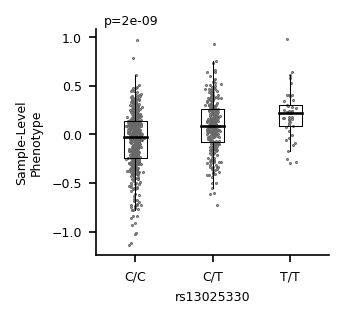

In [15]:
# run firstbelow next cell to ensure phenotype is defined appropriately for the chr2 locus
i_locus = 1
allele = loci.SNP[i_locus]
fig, axs = plt.subplots(1,1,figsize=(2,2), dpi=150)
geno_cnTrait(d, allele = loci.SNP[i_locus], other_allele = loci["Other Allele"][i_locus], 
             effect_allele = loci['Effect Allele'][i_locus], pvalue = loci.P[i_locus], 
             rsID = loci.rsID[i_locus], celltype = loci.celltype[i_locus], 
             sel_chr= loci.CHR[i_locus], ax=axs)
plt.show()

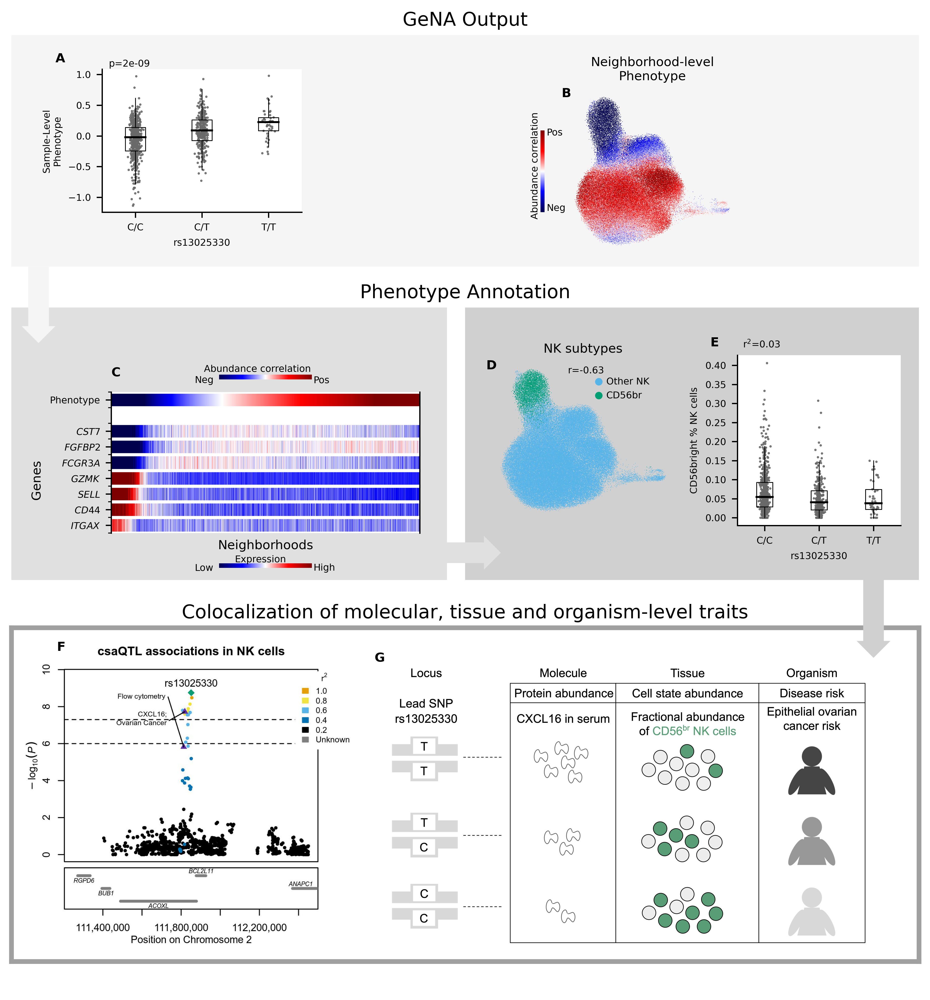

In [16]:
fig = plt.figure(figsize=(8,6), dpi=450, facecolor="white")
i_locus = 1
other_allele = loci.SNP.values[i_locus].split(":")[2]
effect_allele = loci.SNP.values[i_locus].split(":")[3]
rsID = loci.rsID.values[i_locus]
vertical_buffer=0.04

outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=0.04,left=0, top=0.53,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.set_title(outer_titles[2])
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor("None")
outerax.spines[['top', 'right', 'bottom', 'left']].set_color("#A0A0A0")
outerax.spines[['top', 'right', 'bottom', 'left']].set_linewidth(3)

base = 0.6
outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0, top=1,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.set_title(outer_titles[1])
outerax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor('None')

outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0, top=1,  right=0.48)
outerax1 = fig.add_subplot(outergs[0])
outerax1.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax1.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax1.set_facecolor("#E0E0E0")
t = outerax1.text(1.02, 0.1, "                   ", ha="center", va="center", rotation=0, size=7,
            bbox=dict(boxstyle="rarrow,pad=0.3", fc="#E0E0E0", ec="#E0E0E0", lw=2))

outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0.5, top=1,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor("#D0D0D0")
t = outerax.text(0.9, -0.12, "                   ", ha="center", va="center", rotation=-90, size=7,
            bbox=dict(boxstyle="rarrow,pad=0.3", fc="#D0D0D0", ec="#D0D0D0", lw=2))
outerax1.set_zorder(outerax.get_zorder()+1)

### Cell types UMAP
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.09, left=0.53, top=0.92,  right=0.73)
ax = fig.add_subplot(gs[0])
res = pickle.load(open('/data/srlab/lrumker/MCSC_Project/cna-qtl/results/gwas_NK/cna_res_'+loci.SNP[i_locus]+'.p','rb'))
d.obs['frac_CD56'] = 1*(d.obs.celltype=="NK_CD56bright")
d.obs_to_sample(['frac_CD56'], aggregate = np.mean)
ax.scatter(UMAP1, UMAP2, c = color_dict["skyblue"], label = "Other NK", s = 0.1, edgecolor = 'none')
ax.scatter(UMAP1[d.obs.celltype[kept_cells]=="NK_CD56bright"], 
            UMAP2[d.obs.celltype[kept_cells]=="NK_CD56bright"], 
            c = color_dict["green"], label = "CD56br", s = 0.1, edgecolor = 'none')
ax.legend(loc='center', markerscale=15, fontsize=label_size,
            frameon=False, handletextpad=-0.2, bbox_to_anchor=[0.7, 0.83])
ax.axis("off")
ax.set_title("NK subtypes", fontsize = title_size)
r_val = np.around(np.corrcoef(res.ncorrs, d.obs['frac_CD56'][kept_cells])[0,1],2)
ax.text(-0.6, np.max(UMAP2)-0.05*np.max(UMAP2), 'r='+str(r_val), fontsize = label_size)
ax.text(-7, np.max(UMAP2),'D',fontsize=title_size, fontweight="bold")

### Cluster abundance boxplot
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.08, left=0.8, top=0.93,  right=0.98)
ax = fig.add_subplot(gs[0])
geno_jitter = d.samplem[allele+'_binned']+np.random.normal(0, 0.04, d.samplem.shape[0])
geno_labels = [other_allele+"/"+other_allele, other_allele+"/"+effect_allele, effect_allele+"/"+effect_allele]
pheno_grouped = [d.samplem.frac_CD56[d.samplem[allele+'_binned']==0], 
                 d.samplem.frac_CD56[d.samplem[allele+'_binned']==1],
                   d.samplem.frac_CD56[d.samplem[allele+'_binned']==2],]
ax.scatter(geno_jitter, d.samplem.frac_CD56, color = "dimgrey", s = 0.2)
ax.boxplot(pheno_grouped, positions=[0,1,2], showfliers=False, boxprops= dict(linewidth=0.5, color='black'),
                        whiskerprops=dict(linewidth=0.5, color='black'), showcaps = False,
                        medianprops=dict(linewidth=1.25, color='black'))
rsqval = np.corrcoef(d.samplem[allele].values, d.samplem.frac_CD56.values)[0,1]**2
ax.text(-0.4, np.max(d.samplem.frac_CD56)+0.1*np.max(d.samplem.frac_CD56), 
        r'r$^2$='+str(np.around(rsqval,2)), fontsize = label_size)
ax.spines[['right', 'top']].set_visible(False)
ax.set_xlabel(rsID, fontsize=label_size)
ax.set_ylabel("CD56bright % NK cells", fontsize=label_size)
ax.set_xticks([0,1,2])
ax.set_xticklabels(geno_labels)
ax.tick_params(axis='both', which='minor', labelsize=label_size)
ax.tick_params(axis='both', which='major', labelsize=label_size)
ax.text(-1,0.45,'E',fontsize=title_size, fontweight="bold")

### Expression heatmap
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base-0.02, left=0.11, top=0.95,  right=0.45)
ax = fig.add_subplot(gs[0])
plot_gene_heatmap(get_binned_expr(d, celltype="NK", allele = '2:111851212:C:T', 
                                  sel_genes=['ITGAX', 'CD44', 'SELL', 'GZMK', 
                                            'FCGR3A', 'FGFBP2', 'CST7']), ax)
ax.set_zorder(outerax1.get_zorder()+1)
ax.text(0,-1.5,'C',fontsize=title_size, fontweight="bold")

base = 1.06
outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0, top=1.4,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.set_title(outer_titles[0])
outerax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor("#F5F5F5")
t = outerax.text(0.03, -0.15, "                 ", ha="center", va="center", rotation=-90, size=7,
            bbox=dict(boxstyle="rarrow,pad=0.3", fc="#F5F5F5", ec="#F5F5F5", lw=2))
outerax.set_zorder(outerax1.get_zorder()+1)

### Boxplot
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.08, left=0.1, top=1.35,  right=0.32)
ax = fig.add_subplot(gs[0])
geno_cnTrait(d, allele = loci.SNP[i_locus], other_allele = loci["Other Allele"][i_locus], 
             effect_allele = loci['Effect Allele'][i_locus], pvalue = loci.P[i_locus], 
             rsID = loci.rsID[i_locus], celltype = loci.celltype[i_locus], 
             sel_chr= loci.CHR[i_locus], ax=ax)
ax.set_zorder(outerax.get_zorder()+1)
ax.text(-1.2,1.2,'A',fontsize=title_size, fontweight="bold")

### ncorrs UMAP
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.02, left=0.55, top=1.32, right=0.8)
ax = fig.add_subplot(gs[0])
cbar_plot = plt.scatter(UMAP1, UMAP2, c = res.ncorrs, s=0.1, cmap="seismic")
cover_plot = plt.scatter(UMAP1, UMAP2, c = "#F5F5F5", s=1)
pp.scatter_random(UMAP1, UMAP2, c = res.ncorrs, ax = ax, cmap="seismic")
ax.set_title("Neighborhood-level\nPhenotype", fontsize = title_size)
cbar = plt.colorbar(cbar_plot, ticks = [], shrink=0.5, location='left', ax = ax)
cbar.set_ticklabels([])
ax.text(-9.6,-0.35*np.max(UMAP2),'Abundance correlation', fontsize=label_size, rotation = 90)
ax.text(-8.25,-0.28*np.max(UMAP2),'Neg', fontsize=label_size)
ax.text(-8.25,0.57*np.max(UMAP2),'Pos', fontsize=label_size)
cbar.outline.set_visible(False)
ax.axis("off")
ax.set_zorder(outerax.get_zorder()+1)
cbar.ax.set_zorder(outerax.get_zorder()+1)
ax.text(-7,np.max(UMAP2),'B',fontsize=title_size, fontweight="bold")

### Locus zoom 
locus_zoom_12 = plt.imread(fig_dir+'NK_chr2_regional.jpg')
zoomax = fig.add_axes([-0.035,0.045,0.48,0.48], anchor='NE')
zoomax.imshow(locus_zoom_12)
zoomax.axis('off')
zoomax.set_in_layout(False)

### diagram
diagram = plt.imread(fig_dir+'CXCL16_diagram.png')
newax = fig.add_axes([0.4,-0.08,0.56,0.56], anchor='NE')
newax.imshow(diagram)
newax.axis('off')
newax.set_in_layout(False)
newax.set_zorder(zoomax.get_zorder()+1)

gs = gridspec.GridSpec(1,1)
gs.update(bottom=0,left=0, top=0.4,  right=1)
ax = fig.add_subplot(gs[0])
ax.text(0.05,1.24,'F',fontsize=title_size, fontweight="bold")
ax.text(0.4,1.2,'G',fontsize=title_size, fontweight="bold")
ax.axis("off")
ax.set_zorder(newax.get_zorder()+1)

plt.savefig(fig_dir+"suppfig.csaQTL_chr2.png", bbox_inches='tight')
plt.show()

## csaQTL at 5q25.1

In [17]:
# load myeloid object
d_M = cna.read("/data/srlab/lrumker/datasets/onek1k/pheno/Myeloid.h5ad")
kept_cells = d_M.uns['keptcells']
UMAP1 = d_M.obsm['X_umap'][kept_cells,0]
UMAP2 = d_M.obsm['X_umap'][kept_cells,1]

i_locus = 0
allele = loci.SNP[i_locus]
sel_chr = allele.split(":")[0]
G = pd.read_csv("/data/srlab/lrumker/MCSC_Project/cna-qtl/results/geno_munge/sig_snps/Myeloid"+\
                "_sigsnps.DS.vcf.gz", header = None, sep = "\t", index_col=0)
G_iids = pd.read_csv("/data/srlab/lrumker/datasets/onek1k/geno/"+\
                 "sample_labels/sample_list_rowsep.txt", header = None).iloc[:,0].values
G.columns = G_iids
G.index = [G.index[i].strip() for i in np.arange(G.shape[0])]
d_M.samplem = d_M.samplem.join(G.T[allele])

other_allele = loci.SNP.values[i_locus].split(":")[2]
effect_allele = loci.SNP.values[i_locus].split(":")[3]
rsID = loci.rsID.values[i_locus]

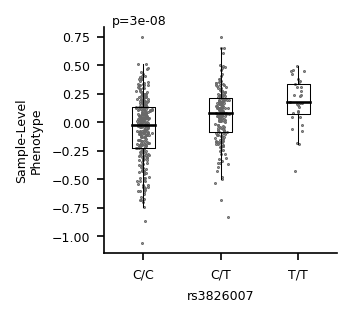

In [18]:
# run firstbelow next cell to ensure phenotype is defined appropriately for the chr15 locus

fig, axs = plt.subplots(1,1,figsize=(2,2), dpi=150)
geno_cnTrait(d_M, allele = loci.SNP[i_locus], other_allele = loci["Other Allele"][i_locus], 
             effect_allele = loci['Effect Allele'][i_locus], pvalue = loci.P[i_locus], 
             rsID = loci.rsID[i_locus], celltype = loci.celltype[i_locus], 
             sel_chr= loci.CHR[i_locus], ax=axs)
plt.show()

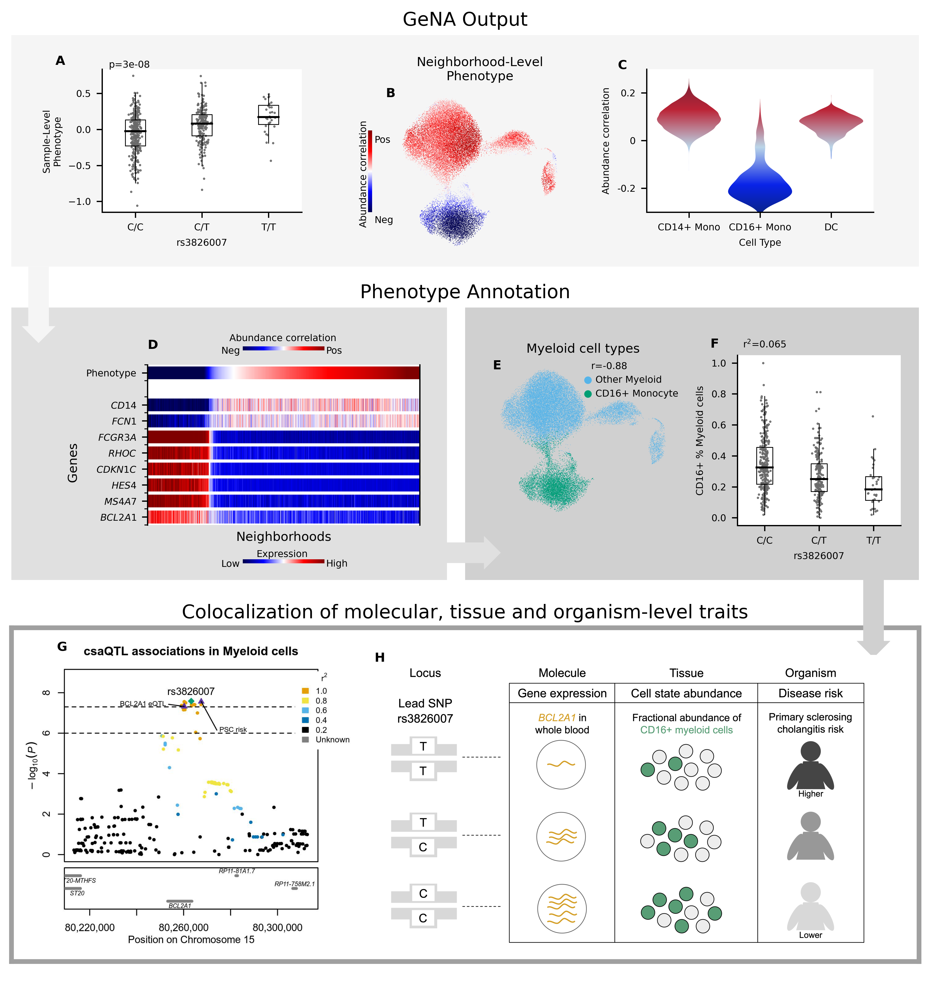

In [19]:
fig = plt.figure(figsize=(8,6), dpi=450, facecolor="white")
i_locus = 0
vertical_buffer=0.04

outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=0.04,left=0, top=0.53,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.set_title(outer_titles[2])
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor("None")
outerax.spines[['top', 'right', 'bottom', 'left']].set_color("#A0A0A0")
outerax.spines[['top', 'right', 'bottom', 'left']].set_linewidth(3)

base = 0.6
outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0, top=1,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.set_title(outer_titles[1])
outerax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor('None')

outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0, top=1,  right=0.48)
outerax1 = fig.add_subplot(outergs[0])
outerax1.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax1.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax1.set_facecolor("#E0E0E0")
t = outerax1.text(1.02, 0.1, "                   ", ha="center", va="center", rotation=0, size=7,
            bbox=dict(boxstyle="rarrow,pad=0.3", fc="#E0E0E0", ec="#E0E0E0", lw=2))

outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0.5, top=1,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor("#D0D0D0")
t = outerax.text(0.9, -0.12, "                   ", ha="center", va="center", rotation=-90, size=7,
            bbox=dict(boxstyle="rarrow,pad=0.3", fc="#D0D0D0", ec="#D0D0D0", lw=2))
outerax1.set_zorder(outerax.get_zorder()+1)

### Cell types UMAP
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.09, left=0.53, top=0.92,  right=0.73)
ax = fig.add_subplot(gs[0])
res = pickle.load(open('/data/srlab/lrumker/MCSC_Project/cna-qtl/results/gwas_Myeloid/cna_res_'+loci.SNP[i_locus]+'.p','rb'))
d_M.obs['frac_CD16'] = 1*(d_M.obs.celltype=="CD16 Mono")
d_M.obs_to_sample(['frac_CD16'], aggregate = np.mean)
ax.scatter(UMAP1, UMAP2, c = color_dict["skyblue"], label = "Other Myeloid", s = 0.1, edgecolor = 'none')
ax.scatter(UMAP1[d_M.obs.celltype[kept_cells]=="CD16 Mono"], 
            UMAP2[d_M.obs.celltype[kept_cells]=="CD16 Mono"], 
            c = color_dict["green"], label = "CD16+ Monocyte", s = 0.1, edgecolor='none')
ax.legend(loc='center', markerscale=15, fontsize=label_size,
            frameon=False, handletextpad=-0.2, bbox_to_anchor=[0.75, 0.84])
ax.axis("off")
ax.set_title("Myeloid cell types", fontsize = title_size)
r_val = np.around(np.corrcoef(res.ncorrs, d_M.obs['frac_CD16'][kept_cells])[0,1],2)
ax.text(4, np.max(UMAP2), 'r='+str(r_val), fontsize = label_size)
ax.text(-6, np.max(UMAP2),'E',fontsize=title_size, fontweight="bold")

### Cluster abundance boxplot
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.08, left=0.8, top=0.93,  right=0.98)
ax = fig.add_subplot(gs[0])
geno_jitter = d_M.samplem[allele+'_binned']+np.random.normal(0, 0.04, d_M.samplem.shape[0])
geno_labels = [other_allele+"/"+other_allele, other_allele+"/"+effect_allele, effect_allele+"/"+effect_allele]
pheno_grouped = [d_M.samplem.frac_CD16[d_M.samplem[allele+'_binned']==0], 
                 d_M.samplem.frac_CD16[d_M.samplem[allele+'_binned']==1],
                   d_M.samplem.frac_CD16[d_M.samplem[allele+'_binned']==2],]
ax.scatter(geno_jitter, d_M.samplem.frac_CD16, color = "dimgrey", s = 0.2)
ax.boxplot(pheno_grouped, positions=[0,1,2], showfliers=False, boxprops= dict(linewidth=0.5, color='black'),
                        whiskerprops=dict(linewidth=0.5, color='black'), showcaps = False,
                        medianprops=dict(linewidth=1.25, color='black'))
rsqval = np.corrcoef(d_M.samplem[allele].values, d_M.samplem.frac_CD16.values)[0,1]**2
ax.text(-0.4, np.max(d_M.samplem.frac_CD16)+0.1*np.max(d_M.samplem.frac_CD16), 
        r'r$^2$='+str(np.around(rsqval,3)), fontsize = label_size)
ax.spines[['right', 'top']].set_visible(False)
ax.set_xlabel("rs3826007", fontsize=label_size)
ax.set_ylabel("CD16+ % Myeloid cells", fontsize=label_size)
ax.set_xticks([0,1,2])
ax.set_xticklabels(geno_labels)
ax.tick_params(axis='both', which='minor', labelsize=label_size)
ax.tick_params(axis='both', which='major', labelsize=label_size)
ax.text(-1,1.1,'F',fontsize=title_size, fontweight="bold")

### Expression heatmap
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base-0.02, left=0.15, top=1.00,  right=0.45)
ax = fig.add_subplot(gs[0])
plot_gene_heatmap(get_binned_expr(d_M, celltype="Myeloid", allele = '15:80263217:C:T', 
                                  sel_genes=['BCL2A1', 'MS4A7', 'HES4', 'CDKN1C', 'RHOC','FCGR3A',
                                             'FCN1','CD14'], verbose = False), ax)
ax.set_zorder(outerax1.get_zorder()+1)
ax.text(0,-1.5,'D',fontsize=title_size, fontweight="bold")

base = 1.06
outergs = gridspec.GridSpec(1, 1)
outergs.update(bottom=base,left=0, top=1.4,  right=1)
outerax = fig.add_subplot(outergs[0])
outerax.set_title(outer_titles[0])
outerax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
outerax.tick_params(axis='both',which='both',bottom=0,left=0, labelbottom=0, labelleft=0)
outerax.set_facecolor("#F5F5F5")
t = outerax.text(0.03, -0.15, "                 ", ha="center", va="center", rotation=-90, size=7,
            bbox=dict(boxstyle="rarrow,pad=0.3", fc="#F5F5F5", ec="#F5F5F5", lw=2))
outerax.set_zorder(outerax1.get_zorder()+1)

### Boxplot
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.08, left=0.1, top=1.35,  right=0.32)
ax = fig.add_subplot(gs[0])
geno_cnTrait(d_M, allele = loci.SNP[i_locus], other_allele = loci["Other Allele"][i_locus], 
             effect_allele = loci['Effect Allele'][i_locus], pvalue = loci.P[i_locus], 
             rsID = loci.rsID[i_locus], celltype = loci.celltype[i_locus], 
             sel_chr= loci.CHR[i_locus], ax=ax)
ax.set_zorder(outerax.get_zorder()+1)
ax.text(-1.2,0.9,'A',fontsize=title_size, fontweight="bold")

### ncorrs UMAP
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.02, left=0.36, top=1.32, right=0.61)
ax = fig.add_subplot(gs[0])
cbar_plot = plt.scatter(UMAP1, UMAP2, c = res.ncorrs, s=0.001, cmap="seismic")
cover_plot = plt.scatter(UMAP1, UMAP2, c = "#F5F5F5", s=1)
pp.scatter_random(UMAP1, UMAP2, c = res.ncorrs, ax = ax, cmap="seismic")
ax.set_title("Neighborhood-Level\nPhenotype", fontsize = title_size)
cbar = plt.colorbar(cbar_plot, ticks = [], shrink=0.5, location='left', ax = ax)
cbar.set_ticklabels([])
ax.text(-9.9,-0.07*np.max(UMAP2),'Abundance correlation', fontsize=label_size, rotation = 90)
ax.text(-8.25,-0.05*np.max(UMAP2),'Neg', fontsize=label_size)
ax.text(-8.25,0.62*np.max(UMAP2),'Pos', fontsize=label_size)
cbar.outline.set_visible(False)
ax.axis("off")
ax.set_zorder(outerax.get_zorder()+1)
cbar.ax.set_zorder(outerax.get_zorder()+1)
ax.text(-7,np.max(UMAP2),'B',fontsize=title_size, fontweight="bold")

### Violinplot
gs = gridspec.GridSpec(1,1)
gs.update(bottom=base+0.08, left=0.7, top=1.35,  right=0.95)
ax = fig.add_subplot(gs[0])
d_M.obs['plot_types'] = np.repeat('DC', d_M.obs.shape[0])
d_M.obs.loc[d_M.obs.celltype=="CD16 Mono",'plot_types'] = "CD16+ Mono"
d_M.obs.loc[d_M.obs.celltype=="CD14 Mono",'plot_types'] = "CD14+ Mono"
cna.pl.violinplot(d_M[res.kept,:], res, 'plot_types', ax = ax)
ax.set_xticklabels(['CD14+ Mono', 'CD16+ Mono', 'DC'], fontsize = label_size)
ax.set_ylim([-0.25, 0.25])
ax.set_xlabel("Cell Type", fontsize = label_size)
ax.set_ylabel("Abundance correlation", fontsize = label_size)
ax.set_yticks([-0.2, 0, 0.2])
ax.set_yticklabels([-0.2, 0, 0.2], fontsize =label_size)
ax.set_ylim([-0.3, 0.3])
ax.spines[['right', 'top']].set_visible(False)
ax.set_zorder(outerax.get_zorder()+1)
ax.text(-1,0.3,'C',fontsize=title_size, fontweight="bold")

### Locus zoom 
locus_zoom_12 = plt.imread(fig_dir+'Myeloid_chr15_regional.jpg')
zoomax = fig.add_axes([-0.035,0.045,0.48,0.48], anchor='NE')
zoomax.imshow(locus_zoom_12)
zoomax.axis('off')
zoomax.set_in_layout(False)

### diagram
diagram = plt.imread(fig_dir+'BCL2A1_diagram.png')
newax = fig.add_axes([0.4,-0.07,0.56,0.56], anchor='NE')
newax.imshow(diagram)
newax.axis('off')
newax.set_in_layout(False)
newax.set_zorder(zoomax.get_zorder()+1)

gs = gridspec.GridSpec(1,1)
gs.update(bottom=0,left=0, top=0.4,  right=1)
ax = fig.add_subplot(gs[0])
ax.text(0.05,1.24,'G',fontsize=title_size, fontweight="bold")
ax.text(0.4,1.2,'H',fontsize=title_size, fontweight="bold")
ax.axis("off")
ax.set_zorder(newax.get_zorder()+1)

plt.savefig(fig_dir+"suppfig.csaQTL_chr15.png", bbox_inches='tight')
plt.show()

## Plot expression of eGenes

In [20]:
# load NK object
d = cna.read("/data/srlab/lrumker/datasets/onek1k/pheno/NK.h5ad")
kept_cells = d.uns['keptcells']
UMAP1 = d.obsm['X_umap'][kept_cells,0]
UMAP2 = d.obsm['X_umap'][kept_cells,1]

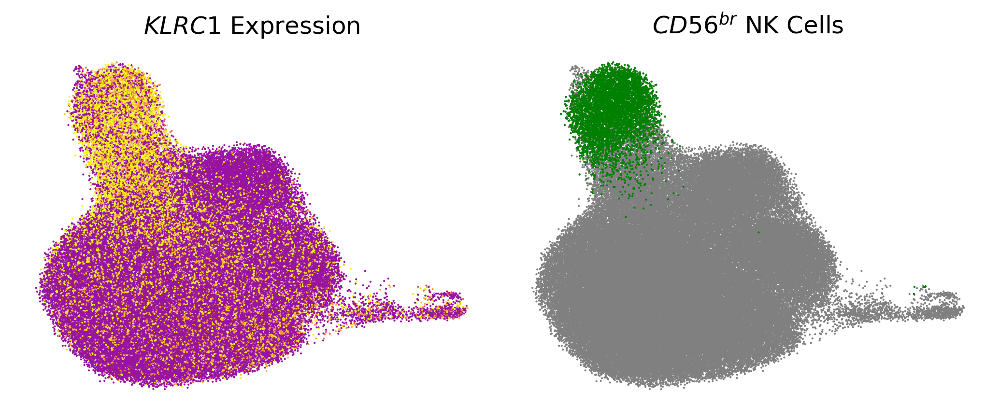

In [21]:
pp.umapprops['s']=1
fig, axes = plt.subplots(1, 2, figsize=(7,3), dpi = 300)
i_gene = np.where(d.var.index=='KLRC1')[0]
pp.scatter_random(UMAP1, UMAP2, c = d.X[kept_cells,i_gene], cmap = "plasma", ax = axes[0])
axes[0].axis("off")
axes[0].set_title(r"$KLRC1$ Expression")

axes[1].scatter(UMAP1, UMAP2, c = "grey", s = 1, edgecolor='none')
mask = d.obs.celltype[kept_cells]=="NK_CD56bright"
axes[1].scatter(UMAP1[mask], UMAP2[mask], c = "green", s = 1, edgecolor='none')
axes[1].axis("off")
axes[1].set_title("$CD56^{br}$ NK Cells")

plt.tight_layout()
plt.savefig(fig_dir+"suppfig.DE_KLRC1.png", dpi = 300, transparent = True)
plt.show()

In [22]:
# load myeloid object
d_M = cna.read("/data/srlab/lrumker/datasets/onek1k/pheno/Myeloid.h5ad")

In [23]:
# load allcells object
d_all = cna.read("/data/srlab/lrumker/datasets/onek1k/pheno/allcells.h5ad")

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(7,3), dpi = 300)

kept_cells = d_all.uns['keptcells']
UMAP1 = d_all.obsm['X_umap'][kept_cells,0]
UMAP2 = d_all.obsm['X_umap'][kept_cells,1]
pp.umapprops['s']=0.5

axes[0].scatter(UMAP1, UMAP2, c = "grey", s = 0.5, edgecolor='none', label = "Other")
mask = d_all.obs.celltype[kept_cells]=="CD16 Mono"
axes[0].scatter(UMAP1[mask], UMAP2[mask], c = "green", s = 0.5, edgecolor='none', label = "CD16+ mono")
axes[0].legend(loc="upper left", markerscale=8., fontsize = 8, frameon = False, title="Cell type")
axes[0].axis("off")
axes[0].set_title("All cells")

i_gene = np.where(d_all.var.index=='BCL2A1')[0]

cbar_plot = axes[1].scatter(UMAP1, UMAP2, c = d_all.X[kept_cells,i_gene], s=0.01, cmap="plasma")
cover_plot = axes[1].scatter(UMAP1, UMAP2, c = "#D0D0D0", s=0.1)
cbar = plt.colorbar(cbar_plot, ticks = [], shrink=0.5, location='left', ax = axes[1])
cbar.set_ticklabels([])
axes[1].text(-16.5,0.3*np.max(UMAP2),'Expression', fontsize=label_size, rotation = 90)
axes[1].text(-15,0*np.max(UMAP2),'Low', fontsize=label_size)
axes[1].text(-15,0.75*np.max(UMAP2),'High', fontsize=label_size)
cbar.outline.set_visible(False)

pp.scatter_random(UMAP1, UMAP2, c = d_all.X[kept_cells,i_gene], cmap = "plasma", ax = axes[1])
axes[1].axis("off")
axes[1].set_title(r"$BCL2A1$ Expression")

plt.tight_layout()
plt.savefig(fig_dir+"suppfig.DE_BCL2A1.png", dpi = 300, transparent = True)
plt.show()

## Functional annotations for missense variants

In [ ]:
lead_snp = "15:80263217:C:T"
celltype="Myeloid"
annovar = pd.read_table(res_folder+"annovar/"+celltype+"_"+lead_snp+"_cis.hg19_multianno.txt")
annovar = annovar.iloc[:,:75]
annovar['ID'] = [str(annovar.Chr.values[i])+":"+str(annovar.Start.values[i]) +":"+annovar.Ref.values[i]+
                 ":"+annovar.Alt.values[i] for i in np.arange(annovar.shape[0])]
annovar.set_index("ID", inplace = True)

annovar.loc[lead_snp,['SIFT_score', 'SIFT_pred', 'Polyphen2_HDIV_score',
       'Polyphen2_HDIV_pred', 'Polyphen2_HVAR_score']]